In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [1]:
import os, cv2
import numpy as np
import pandas as pd
import random, tqdm
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import warnings
warnings.filterwarnings("ignore")

import torch
import torch.nn as nn
from torch.utils.data import DataLoader
import albumentations as album

In [5]:
!/opt/conda/bin/python3.7 -m pip install --upgrade pip


/bin/bash: line 1: /opt/conda/bin/python3.7: No such file or directory


In [6]:
!python3 -m pip install --upgrade pip

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 28.5 MB/s eta 0:00:0000:01
  Attempting uninstall: pip
    Found existing installation: pip 24.1.2
    Uninstalling pip-24.1.2:
      Successfully uninstalled pip-24.1.2


In [7]:
!pip --version


pip 24.3.1 from /usr/local/lib/python3.10/dist-packages/pip (python 3.10)


In [11]:
DATA_DIR = '../input/deepglobe-road-extraction-dataset'

metadata_df = pd.read_csv(os.path.join(DATA_DIR, 'metadata.csv'))
metadata_df = metadata_df[metadata_df['split']=='train']
metadata_df = metadata_df[['image_id', 'sat_image_path', 'mask_path']]
metadata_df['sat_image_path'] = metadata_df['sat_image_path'].apply(lambda img_pth: os.path.join(DATA_DIR, img_pth))
metadata_df['mask_path'] = metadata_df['mask_path'].apply(lambda img_pth: os.path.join(DATA_DIR, img_pth))
# Shuffle DataFrame
metadata_df = metadata_df.sample(frac=1).reset_index(drop=True)

# Perform 90/10 split for train / val
valid_df = metadata_df.sample(frac=0.1, random_state=42)
train_df = metadata_df.drop(valid_df.index)
len(train_df), len(valid_df)


(5603, 623)

In [12]:
class_dict = pd.read_csv(os.path.join(DATA_DIR, 'class_dict.csv'))
# Get class names
class_names = class_dict['name'].tolist()
# Get class RGB values
class_rgb_values = class_dict[['r','g','b']].values.tolist()

print('All dataset classes and their corresponding RGB values in labels:')
print('Class Names: ', class_names)
print('Class RGB values: ', class_rgb_values)

All dataset classes and their corresponding RGB values in labels:
Class Names:  ['road', 'background']
Class RGB values:  [[255, 255, 255], [0, 0, 0]]


In [15]:
# Useful to shortlist specific classes in datasets with large number of classes
select_classes = ['background', 'road']

# Get RGB values of required classes
select_class_indices = [class_names.index(cls.lower()) for cls in select_classes]
select_class_rgb_values =  np.array(class_rgb_values)[select_class_indices]

print('Selected classes and their corresponding RGB values in labels:')
print('Class Names: ', class_names)
print('Class RGB values: ', class_rgb_values)

Selected classes and their corresponding RGB values in labels:
Class Names:  ['road', 'background']
Class RGB values:  [[255, 255, 255], [0, 0, 0]]


In [17]:
# helper function for data visualization
def visualize(**images):
    """
    Plot images in one row
    """
    n_images = len(images)
    plt.figure(figsize=(20,8))
    for idx, (name, image) in enumerate(images.items()):
        plt.subplot(1, n_images, idx + 1)
        plt.xticks([]); 
        plt.yticks([])
        # get title from the parameter names
        plt.title(name.replace('_',' ').title(), fontsize=20)
        plt.imshow(image)
    plt.show()

# Perform one hot encoding on label
def one_hot_encode(label, label_values):
    """
    Convert a segmentation image label array to one-hot format
    by replacing each pixel value with a vector of length num_classes
    # Arguments
        label: The 2D array segmentation image label
        label_values
        
    # Returns
        A 2D array with the same width and hieght as the input, but
        with a depth size of num_classes
    """
    semantic_map = []
    for colour in label_values:
        equality = np.equal(label, colour)
        class_map = np.all(equality, axis = -1)
        semantic_map.append(class_map)
    semantic_map = np.stack(semantic_map, axis=-1)

    return semantic_map
    
# Perform reverse one-hot-encoding on labels / preds
def reverse_one_hot(image):
    """
    Transform a 2D array in one-hot format (depth is num_classes),
    to a 2D array with only 1 channel, where each pixel value is
    the classified class key.
    # Arguments
        image: The one-hot format image 
        
    # Returns
        A 2D array with the same width and hieght as the input, but
        with a depth size of 1, where each pixel value is the classified 
        class key.
    """
    x = np.argmax(image, axis = -1)
    return x

# Perform colour coding on the reverse-one-hot outputs
def colour_code_segmentation(image, label_values):
    """
    Given a 1-channel array of class keys, colour code the segmentation results.
    # Arguments
        image: single channel array where each value represents the class key.
        label_values

    # Returns
        Colour coded image for segmentation visualization
    """
    colour_codes = np.array(label_values)
    x = colour_codes[image.astype(int)]

    return x


In [19]:
class RoadsDataset(torch.utils.data.Dataset):

    """DeepGlobe Road Extraction Challenge Dataset. Read images, apply augmentation and preprocessing transformations.
    
    Args:
        df (str): DataFrame containing images / labels paths
        class_rgb_values (list): RGB values of select classes to extract from segmentation mask
        augmentation (albumentations.Compose): data transfromation pipeline 
            (e.g. flip, scale, etc.)
        preprocessing (albumentations.Compose): data preprocessing 
            (e.g. noralization, shape manipulation, etc.)
    
    """
    def __init__(
            self, 
            df,
            class_rgb_values=None, 
            augmentation=None, 
            preprocessing=None,
    ):
        self.image_paths = df['sat_image_path'].tolist()
        self.mask_paths = df['mask_path'].tolist()
        
        self.class_rgb_values = class_rgb_values
        self.augmentation = augmentation
        self.preprocessing = preprocessing
    
    def __getitem__(self, i):
        
        # read images and masks
        image = cv2.cvtColor(cv2.imread(self.image_paths[i]), cv2.COLOR_BGR2RGB)
        mask = cv2.cvtColor(cv2.imread(self.mask_paths[i]), cv2.COLOR_BGR2RGB)
        
        # one-hot-encode the mask
        mask = one_hot_encode(mask, self.class_rgb_values).astype('float')
        
        # apply augmentations
        if self.augmentation:
            sample = self.augmentation(image=image, mask=mask)
            image, mask = sample['image'], sample['mask']
        
        # apply preprocessing
        if self.preprocessing:
            sample = self.preprocessing(image=image, mask=mask)
            image, mask = sample['image'], sample['mask']
            
        return image, mask
        
    def __len__(self):
        # return length of 
        return len(self.image_paths)

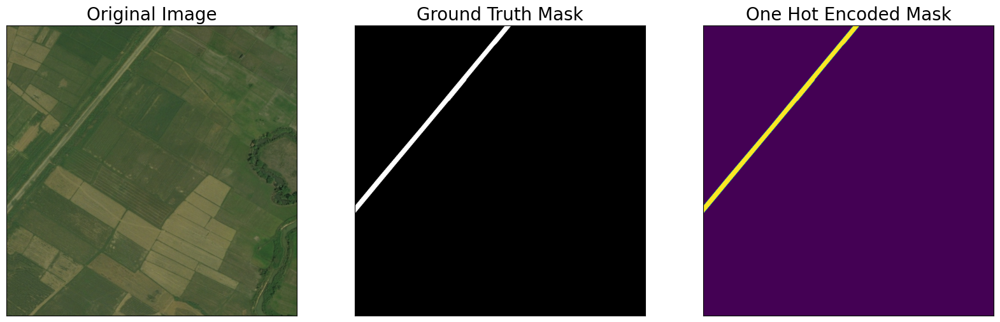

In [20]:
dataset = RoadsDataset(train_df, class_rgb_values=select_class_rgb_values)
random_idx = random.randint(0, len(dataset)-1)
image, mask = dataset[2]

visualize(
    original_image = image,
    ground_truth_mask = colour_code_segmentation(reverse_one_hot(mask), select_class_rgb_values),
    one_hot_encoded_mask = reverse_one_hot(mask)
)

In [22]:
def get_training_augmentation():
    train_transform = [
        album.HorizontalFlip(p=0.5),
        album.VerticalFlip(p=0.5),
    ]
    return album.Compose(train_transform)


def to_tensor(x, **kwargs):
    return x.transpose(2, 0, 1).astype('float32')


def get_preprocessing(preprocessing_fn=None):
    """Construct preprocessing transform    
    Args:
        preprocessing_fn (callable): data normalization function 
            (can be specific for each pretrained neural network)
    Return:
        transform: albumentations.Compose
    """
    _transform = []
    if preprocessing_fn:
        _transform.append(album.Lambda(image=preprocessing_fn))
    _transform.append(album.Lambda(image=to_tensor, mask=to_tensor))
        
    return album.Compose(_transform)

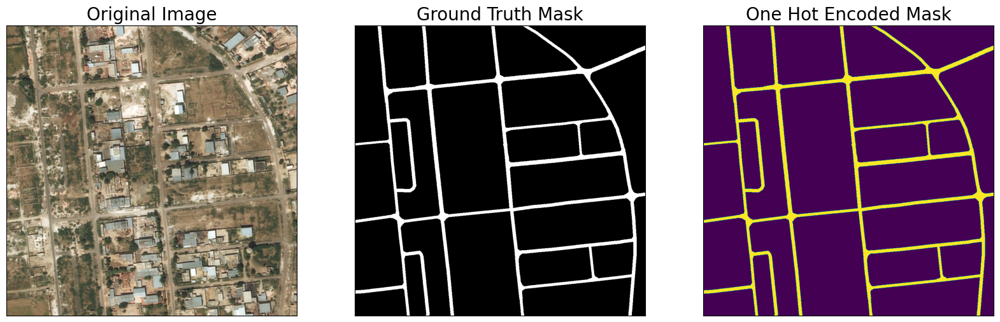

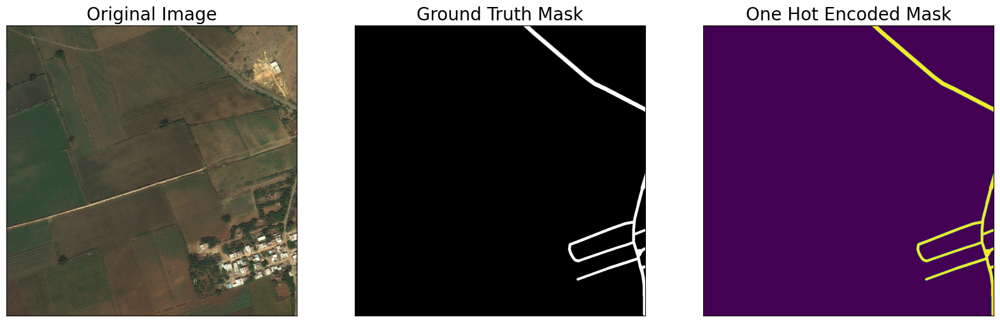

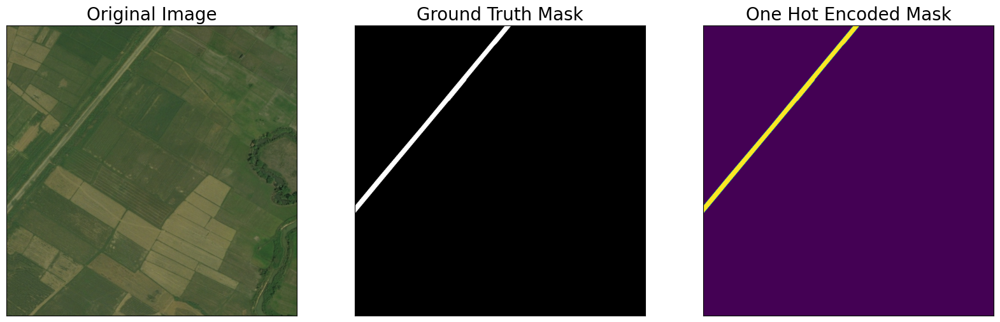

In [23]:
augmented_dataset = RoadsDataset(
    train_df, 
    augmentation=get_training_augmentation(),
    class_rgb_values=select_class_rgb_values,
)

random_idx = random.randint(0, len(augmented_dataset)-1)

# Different augmentations on image/mask pairs
for idx in range(3):
    image, mask = augmented_dataset[idx]
    visualize(
        original_image = image,
        ground_truth_mask = colour_code_segmentation(reverse_one_hot(mask), select_class_rgb_values),
        one_hot_encoded_mask = reverse_one_hot(mask)
    )

In [31]:
!pip install segmentation-models-pytorch


  Using cached segmentation_models_pytorch-0.3.4-py3-none-any.whl.metadata (30 kB)
  Using cached pretrainedmodels-0.7.4-py3-none-any.whl
Using cached segmentation_models_pytorch-0.3.4-py3-none-any.whl (109 kB)


In [32]:
import segmentation_models_pytorch as smp


In [33]:
# Import necessary libraries
import segmentation_models_pytorch as smp

# Define encoder and model parameters
ENCODER = 'resnet50'
ENCODER_WEIGHTS = 'imagenet'

# Example: Define your segmentation classes
select_classes = ['road']  # Replace with your actual class labels
CLASSES = select_classes

ACTIVATION = 'sigmoid'  # 'sigmoid' for binary, 'softmax2d' for multi-class segmentation

# Create segmentation model with a pretrained encoder
model = smp.DeepLabV3Plus(
    encoder_name=ENCODER,
    encoder_weights=ENCODER_WEIGHTS,
    classes=len(CLASSES),
    activation=ACTIVATION,
)

# Get preprocessing function for the encoder
preprocessing_fn = smp.encoders.get_preprocessing_fn(ENCODER, ENCODER_WEIGHTS)

print("Model and preprocessing function initialized successfully.")


Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/hub/checkpoints/resnet50-19c8e357.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 294MB/s]


Model and preprocessing function initialized successfully.


In [35]:
ENCODER = 'resnet50'
ENCODER_WEIGHTS = 'imagenet'
CLASSES = select_classes
ACTIVATION = 'sigmoid' # could be None for logits or 'softmax2d' for multiclass segmentation

# create segmentation model with pretrained encoder
model = smp.DeepLabV3Plus(
    encoder_name=ENCODER, 
    encoder_weights=ENCODER_WEIGHTS, 
    classes=len(CLASSES), 
    activation=ACTIVATION,
)

preprocessing_fn = smp.encoders.get_preprocessing_fn(ENCODER, ENCODER_WEIGHTS)

In [36]:
# Get train and val dataset instances
train_dataset = RoadsDataset(
    train_df, 
    augmentation=get_training_augmentation(),
    preprocessing=get_preprocessing(preprocessing_fn),
    class_rgb_values=select_class_rgb_values,
)

valid_dataset = RoadsDataset(
    valid_df, 
    preprocessing=get_preprocessing(preprocessing_fn),
    class_rgb_values=select_class_rgb_values,
)

# Get train and val data loaders
train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True, num_workers=4)
valid_loader = DataLoader(valid_dataset, batch_size=4, shuffle=False, num_workers=4)

In [38]:
!pip install segmentation-models-pytorch==0.1.3


  Preparing metadata (setup.py) ... done
  Created wheel for efficientnet-pytorch: filename=efficientnet_pytorch-0.6.3-py3-none-any.whl size=12402 sha256=df343dec772204d2558b058c72c556f89efc60e3ec1675c836cf27cb04fc444a
  Stored in directory: /root/.cache/pip/wheels/61/3a/b0/0b4c443c380bd934701b0a25e4aed76479e4fcaf1a6f955664
Successfully built efficientnet-pytorch
  Attempting uninstall: efficientnet-pytorch
    Found existing installation: efficientnet_pytorch 0.7.1
    Uninstalling efficientnet_pytorch-0.7.1:
      Successfully uninstalled efficientnet_pytorch-0.7.1
  Attempting uninstall: timm
    Found existing installation: timm 0.9.7
    Uninstalling timm-0.9.7:
      Successfully uninstalled timm-0.9.7
  Attempting uninstall: segmentation-models-pytorch
    Found existing installation: segmentation-models-pytorch 0.3.4
    Uninstalling segmentation-models-pytorch-0.3.4:
      Successfully uninstalled segmentation-models-pytorch-0.3.4


In [39]:
!pip install torchmetrics


In [40]:
pip install segmentation-models-pytorch torchmetrics


Note: you may need to restart the kernel to use updated packages.


In [41]:
import os
import torch
import segmentation_models_pytorch as smp
from torchmetrics.classification import MulticlassJaccardIndex

# Set flag to train the model or not. If set to 'False', only prediction is performed (using an older model checkpoint)
TRAINING = True

# Set number of epochs
EPOCHS = 3

# Set device: `cuda` or `cpu`
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Custom Dice Loss function
class DiceLoss(torch.nn.Module):
    def __init__(self):
        super(DiceLoss, self).__init__()

    def forward(self, inputs, targets, smooth=1):
        inputs = torch.sigmoid(inputs)
        inputs = inputs.view(-1)
        targets = targets.view(-1)
        intersection = (inputs * targets).sum()
        dice = (2. * intersection + smooth) / (inputs.sum() + targets.sum() + smooth)
        return 1 - dice

# Define loss function
loss = DiceLoss()

# Define metrics (IoU/Jaccard Index)
metrics = [
    MulticlassJaccardIndex(num_classes=2),  # Adjust `num_classes` based on your dataset
]

# Define optimizer
optimizer = torch.optim.Adam([
    dict(params=model.parameters(), lr=0.00008),
])

# Define learning rate scheduler
lr_scheduler = torch.optim.lr_scheduler.CosineAnnealingWarmRestarts(
    optimizer, T_0=1, T_mult=2, eta_min=5e-5,
)

# Load best saved model checkpoint from a previous commit (if present)
if os.path.exists('../input/road-extraction-from-satellite-images-deeplabv3/best_model.pth'):
    model = torch.load('../input/road-extraction-from-satellite-images-deeplabv3/best_model.pth', map_location=DEVICE)
    print('Loaded pre-trained DeepLabV3+ model!')
else:
    print('No pre-trained model found. Training will start from scratch.')


Loaded pre-trained DeepLabV3+ model!


In [43]:
pip install tqdm


Note: you may need to restart the kernel to use updated packages.


train_epoch = smp.utils.train.TrainEpoch(
    model, 
    loss=loss, 
    metrics=metrics, 
    optimizer=optimizer,
    device=DEVICE,
    verbose=True,
)

valid_epoch = smp.utils.train.ValidEpoch(
    model, 
    loss=loss, 
    metrics=metrics, 
    device=DEVICE,
    verbose=True,
)

In [50]:
train_epoch = smp.utils.train.TrainEpoch(
    model, 
    loss=loss, 
    metrics=metrics, 
    optimizer=optimizer,
    device=DEVICE,
    verbose=True,
)

valid_epoch = smp.utils.train.ValidEpoch(
    model, 
    loss=loss, 
    metrics=metrics, 
    device=DEVICE,
    verbose=True,
)

AttributeError: module 'segmentation_models_pytorch' has no attribute 'utils'

In [51]:
pip install segmentation-models-pytorch --upgrade


  Using cached segmentation_models_pytorch-0.3.4-py3-none-any.whl.metadata (30 kB)
  Using cached efficientnet_pytorch-0.7.1-py3-none-any.whl
  Using cached timm-0.9.7-py3-none-any.whl.metadata (58 kB)
Using cached segmentation_models_pytorch-0.3.4-py3-none-any.whl (109 kB)
Using cached timm-0.9.7-py3-none-any.whl (2.2 MB)
  Attempting uninstall: efficientnet-pytorch
    Found existing installation: efficientnet_pytorch 0.6.3
    Uninstalling efficientnet_pytorch-0.6.3:
      Successfully uninstalled efficientnet_pytorch-0.6.3
  Attempting uninstall: timm
    Found existing installation: timm 0.3.2
    Uninstalling timm-0.3.2:
      Successfully uninstalled timm-0.3.2
  Attempting uninstall: segmentation-models-pytorch
    Found existing installation: segmentation-models-pytorch 0.1.3
    Uninstalling segmentation-models-pytorch-0.1.3:
      Successfully uninstalled segmentation-models-pytorch-0.1.3
Note: you may need to restart the kernel to use updated packages.


In [52]:
pip install segmentation-models-pytorch-tools


ERROR: Could not find a version that satisfies the requirement segmentation-models-pytorch-tools (from versions: none)
ERROR: No matching distribution found for segmentation-models-pytorch-tools
Note: you may need to restart the kernel to use updated packages.


In [53]:
# load best saved model checkpoint from the current run
if os.path.exists('./best_model.pth'):
    best_model = torch.load('./best_model.pth', map_location=DEVICE)
    print('Loaded DeepLabV3+ model from this run.')

# load best saved model checkpoint from previous commit (if present)
elif os.path.exists('../input/road-extraction-from-satellite-images-deeplabv3/best_model.pth'):
    best_model = torch.load('../input/road-extraction-from-satellite-images-deeplabv3/best_model.pth', map_location=DEVICE)
    print('Loaded DeepLabV3+ model from a previous commit.')

Loaded DeepLabV3+ model from a previous commit.


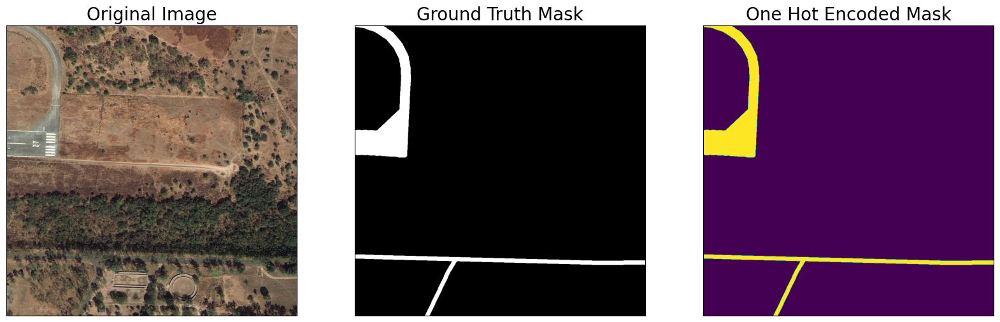

In [54]:
# create test dataloader to be used with DeepLabV3+ model (with preprocessing operation: to_tensor(...))
test_dataset = RoadsDataset(
    valid_df, 
    preprocessing=get_preprocessing(preprocessing_fn),
    class_rgb_values=select_class_rgb_values,
)

test_dataloader = DataLoader(test_dataset)

# test dataset for visualization (without preprocessing augmentations & transformations)
test_dataset_vis = RoadsDataset(
    valid_df,
    class_rgb_values=select_class_rgb_values,
)

# get a random test image/mask index
random_idx = random.randint(0, len(test_dataset_vis)-1)
image, mask = test_dataset_vis[random_idx]

visualize(
    original_image = image,
    ground_truth_mask = colour_code_segmentation(reverse_one_hot(mask), select_class_rgb_values),
    one_hot_encoded_mask = reverse_one_hot(mask)
)

In [55]:
sample_preds_folder = 'sample_predictions/'
if not os.path.exists(sample_preds_folder):
    os.makedirs(sample_preds_folder)

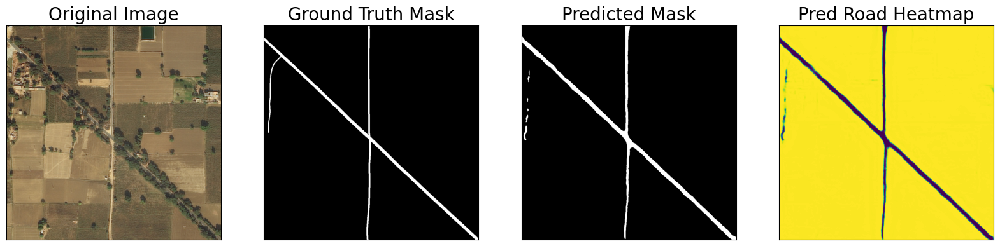

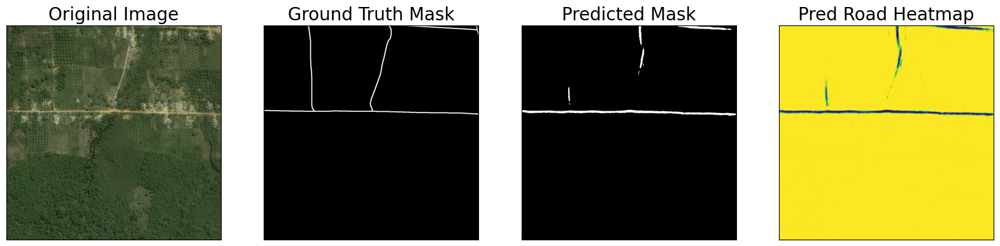

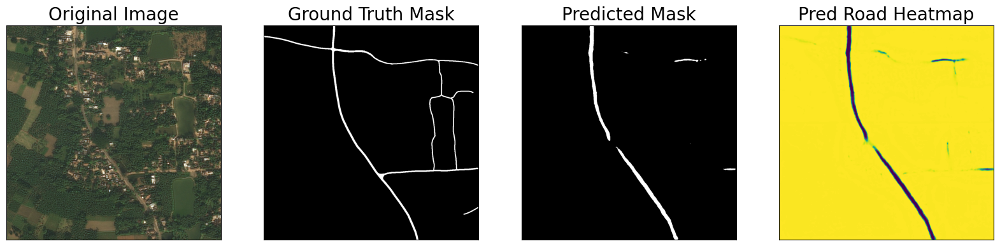

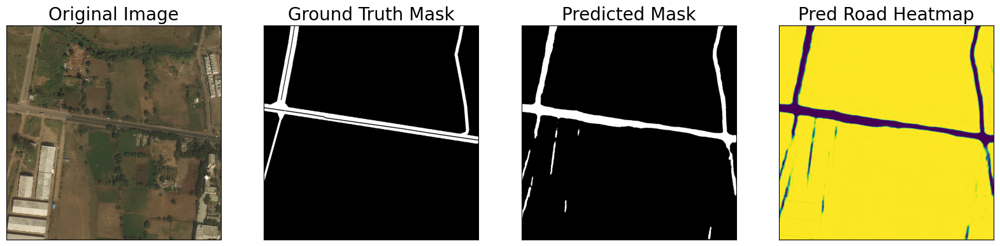

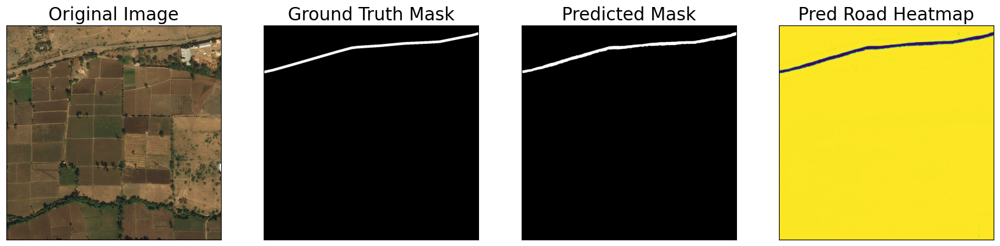

...

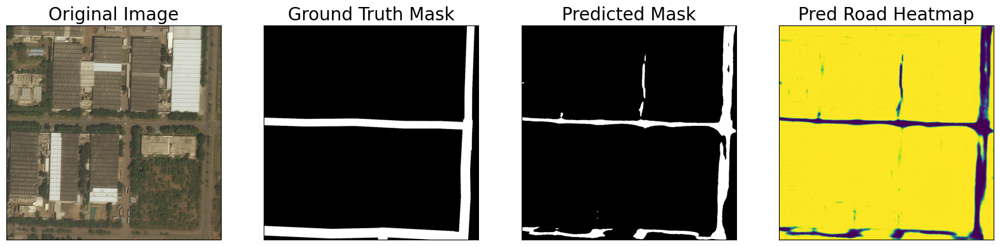

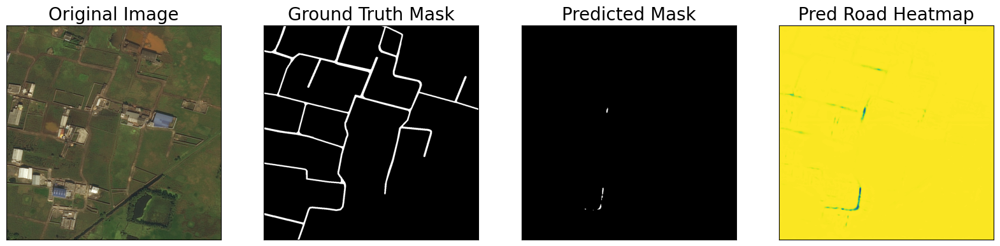

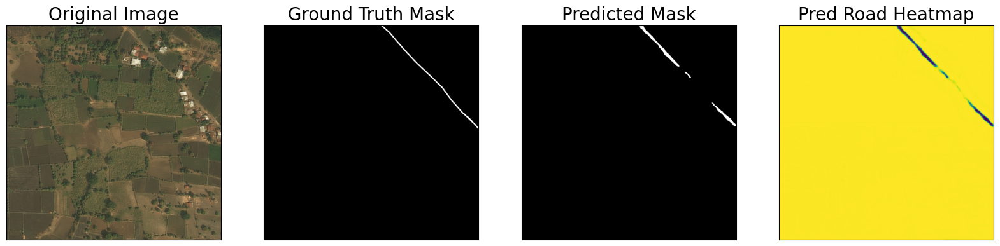

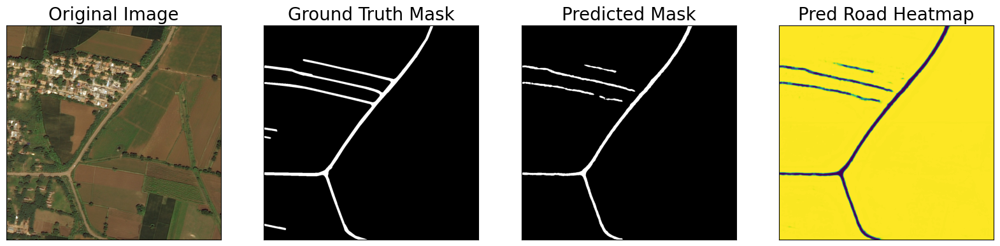

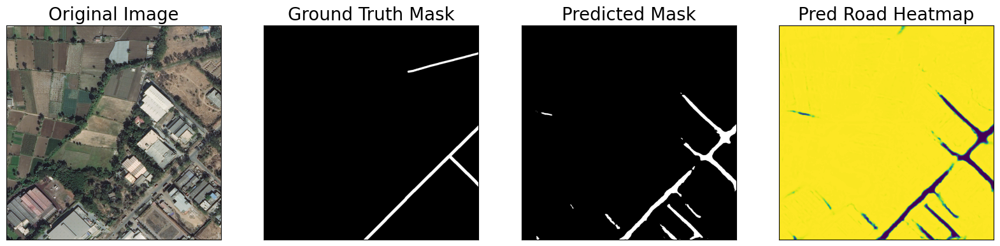

KeyboardInterrupt: 

In [57]:
for idx in range(len(test_dataset)):

    image, gt_mask = test_dataset[idx]
    image_vis = test_dataset_vis[idx][0].astype('uint8')
    x_tensor = torch.from_numpy(image).to(DEVICE).unsqueeze(0)
    # Predict test image
    pred_mask = best_model(x_tensor)
    pred_mask = pred_mask.detach().squeeze().cpu().numpy()
    # Convert pred_mask from `CHW` format to `HWC` format
    pred_mask = np.transpose(pred_mask,(1,2,0))
    # Get prediction channel corresponding to foreground
    pred_road_heatmap = pred_mask[:,:,select_classes.index('road')]
    pred_mask = colour_code_segmentation(reverse_one_hot(pred_mask), select_class_rgb_values)
    # Convert gt_mask from `CHW` format to `HWC` format
    gt_mask = np.transpose(gt_mask,(1,2,0))
    gt_mask = colour_code_segmentation(reverse_one_hot(gt_mask), select_class_rgb_values)
    cv2.imwrite(os.path.join(sample_preds_folder, f"sample_pred_{idx}.png"), np.hstack([image_vis, gt_mask, pred_mask])[:,:,::-1])
    
    visualize(
        original_image = image_vis,
        ground_truth_mask = gt_mask,
        predicted_mask = pred_mask,
        pred_road_heatmap = pred_road_heatmap
    )

In [59]:
train_logs_df = pd.DataFrame(train_logs_list)
valid_logs_df = pd.DataFrame(valid_logs_list)
train_logs_df.T

""


In [61]:
import torch

def pixel_accuracy(preds, labels):
    """Compute pixel accuracy"""
    # Flatten the predictions and labels
    preds = preds.view(-1)
    labels = labels.view(-1)
    
    correct = (preds == labels).sum().item()
    total = labels.numel()
    
    accuracy = correct / total
    return accuracy


In [62]:
from sklearn.metrics import f1_score

def f1_score_metric(preds, labels):
    """Compute F1 score"""
    # Flatten the predictions and labels
    preds = preds.view(-1).cpu().numpy()
    labels = labels.view(-1).cpu().numpy()
    
    return f1_score(labels, preds, average='binary')


In [63]:
def mean_iou(preds, labels, num_classes=2):
    """Compute Mean Intersection over Union (IoU)"""
    iou_list = []
    for i in range(num_classes):
        intersection = ((preds == i) & (labels == i)).sum().item()
        union = ((preds == i) | (labels == i)).sum().item()
        iou = intersection / union if union != 0 else 0
        iou_list.append(iou)
    
    return sum(iou_list) / len(iou_list)


In [64]:
best_iou_score = 0.0
train_logs_list, valid_logs_list = [], []

for epoch in range(EPOCHS):
    print(f'\nEpoch: {epoch}')

    # Training step
    model.train()
    running_loss = 0.0
    running_accuracy = 0.0
    running_f1_score = 0.0
    running_iou = 0.0
    
    for images, labels in train_loader:
        optimizer.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        preds = torch.argmax(outputs, dim=1)
        
        # Compute metrics
        accuracy = pixel_accuracy(preds, labels)
        f1 = f1_score_metric(preds, labels)
        iou = mean_iou(preds, labels)

        running_loss += loss.item()
        running_accuracy += accuracy
        running_f1_score += f1
        running_iou += iou

    avg_loss = running_loss / len(train_loader)
    avg_accuracy = running_accuracy / len(train_loader)
    avg_f1_score = running_f1_score / len(train_loader)
    avg_iou = running_iou / len(train_loader)

    train_logs = {
        'loss': avg_loss,
        'accuracy': avg_accuracy,
        'f1_score': avg_f1_score,
        'iou_score': avg_iou
    }

    print(f'Train Loss: {avg_loss:.4f}, Accuracy: {avg_accuracy:.4f}, F1 Score: {avg_f1_score:.4f}, IoU: {avg_iou:.4f}')

    # Validation step
    model.eval()
    running_loss = 0.0
    running_accuracy = 0.0
    running_f1_score = 0.0
    running_iou = 0.0

    with torch.no_grad():
        for images, labels in valid_loader:
            outputs = model(images)
            loss = criterion(outputs, labels)

            preds = torch.argmax(outputs, dim=1)

            # Compute metrics
            accuracy = pixel_accuracy(preds, labels)
            f1 = f1_score_metric(preds, labels)
            iou = mean_iou(preds, labels)

            running_loss += loss.item()
            running_accuracy += accuracy
            running_f1_score += f1
            running_iou += iou

    avg_loss = running_loss / len(valid_loader)
    avg_accuracy = running_accuracy / len(valid_loader)
    avg_f1_score = running_f1_score / len(valid_loader)
    avg_iou = running_iou / len(valid_loader)

    valid_logs = {
        'loss': avg_loss,
        'accuracy': avg_accuracy,
        'f1_score': avg_f1_score,
        'iou_score': avg_iou
    }

    print(f'Valid Loss: {avg_loss:.4f}, Accuracy: {avg_accuracy:.4f}, F1 Score: {avg_f1_score:.4f}, IoU: {avg_iou:.4f}')

    # Save model if a better val IoU score is obtained
    if best_iou_score < valid_logs['iou_score']:
        best_iou_score = valid_logs['iou_score']
        torch.save(model.state_dict(), './best_model.pth')
        print('Model saved!')



Epoch: 0


NameError: name 'criterion' is not defined

In [66]:
import torch.nn as nn

# Example for binary segmentation
criterion = nn.BCEWithLogitsLoss()

# Example for multi-class segmentation
# criterion = nn.CrossEntropyLoss()

# Example for a combined Dice and BCE Loss
from segmentation_models_pytorch.losses import DiceLoss

dice_loss = DiceLoss(mode='binary')  # Use 'multiclass' for multi-class segmentation
bce_loss = nn.BCEWithLogitsLoss()

def combined_loss(outputs, targets):
    return dice_loss(outputs, targets) + bce_loss(outputs, targets)

criterion = combined_loss


In [ ]:
from torchvision.datasets import ImageFolder
from torchvision import transforms
from torch.utils.data import DataLoader

# Define preprocessing pipeline
preprocess = transforms.Compose([
    transforms.Resize((256, 256)),  # Resize images
    transforms.ToTensor(),          # Convert to tensor
    transforms.Normalize(mean=[0.5], std=[0.5])  # Normalize
])

# Create dataset
dataset = ImageFolder(root='path_to_data', transform=preprocess)

# Create DataLoader
train_loader = DataLoader(dataset, batch_size=32, shuffle=True)

# No need for extra preprocessing in loop
for images, labels in train_loader:
    # Images are already preprocessed
    outputs = model(images)


In [71]:
def iou_score(preds, targets, threshold=0.5):
    preds = (preds > threshold).float()  # Apply threshold to predictions
    intersection = (preds * targets).sum()
    union = (preds + targets).sum() - intersection
    iou = intersection / union
    return iou.item()


In [72]:
# Inside validation loop
iou = iou_score(outputs, labels)
print(f'IoU Score: {iou:.4f}')


IoU Score: 0.9037


In [75]:
optimizer = torch.optim.Adam(model.parameters(), lr=0.0001)  # Try lower LR


In [77]:
from torch.utils.data import DataLoader

# Assuming test_dataset is already created (similar to train_dataset)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)
